# Working on Real Project with Python



---



# The Flights Dataset
***
Here,
The Flights Booking Dataset of various Airlines is a scraped datewise from a famous website in a structured format. The dataset contains the records of flight travel details between the cities in India. Here, multiple features are present like Source & Destination City, Arrival & Departure Time, Duration & Price of the flight etc.


This data is available as a CSV file. We are going to analyze this data set using the Pandas DataFrame.

This analyse will be helpful for those working in Airlines, Travel domain.

-----------

In [2]:
# import the required Python libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [3]:
# import the Flights dataset

data = pd.read_csv("/content/11. airlines_flights_data (1).csv")

In [4]:
data

,index,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1,5953
1,1,SpiceJet,SG-8157,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1,5953
2,2,AirAsia,I5-764,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1,5956
3,3,Vistara,UK-995,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1,5955
4,4,Vistara,UK-963,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1,5955
...,...,...,...,...,...,...,...,...,...,...,...,...
300148,300148,Vistara,UK-822,Chennai,Morning,one,Evening,Hyderabad,Business,10.08,49,69265
300149,300149,Vistara,UK-826,Chennai,Afternoon,one,Night,Hyderabad,Business,10.42,49,77105
300150,300150,Vistara,UK-832,Chennai,Early_Morning,one,Night,Hyderabad,Business,13.83,49,79099
300151,300151,Vistara,UK-828,Chennai,Early_Morning,one,Evening,Hyderabad,Business,10.00,49,81585


**FEATURES**
The various features of the cleaned dataset are explained below:

1) Airline: The name of the airline company is stored in the airline column. It is a categorical feature having 6 different airlines.

2) Flight: Flight stores information regarding the plane's flight code. It is a categorical feature.

3) Source City: City from which the flight takes off. It is a categorical feature having 6 unique cities.

4) Departure Time: This is a derived categorical feature obtained created by grouping time periods into bins. It stores information about the departure time and have 6 unique time labels.

5) Stops: A categorical feature with 3 distinct values that stores the number of stops between the source and destination cities.

6) Arrival Time: This is a derived categorical feature created by grouping time intervals into bins. It has six distinct time labels and keeps information about the arrival time.

7) Destination City: City where the flight will land. It is a categorical feature having 6 unique cities.

8) Class: A categorical feature that contains information on seat class; it has two distinct values: Business and Economy.

9) Duration: A continuous feature that displays the overall amount of time it takes to travel between cities in hours.

10) Days Left: This is a derived characteristic that is calculated by subtracting the trip date by the booking date.

11) Price: Target variable stores information of the ticket price.

# Cleaning the data

In [5]:
# Remove the 'index' column
data.drop( columns = 'index',inplace = True)

In [6]:
data.sample(10)

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
296219,Air_India,AI-569,Chennai,Early_Morning,one,Afternoon,Kolkata,Business,29.83,9,54481
213241,Vistara,UK-943,Delhi,Early_Morning,one,Evening,Bangalore,Business,10.25,17,64969
258260,Vistara,UK-814,Bangalore,Night,one,Morning,Hyderabad,Business,12.50,38,56588
89772,AirAsia,I5-1562,Bangalore,Afternoon,two_or_more,Late_Night,Delhi,Economy,10.50,30,2723
219345,Air_India,AI-560,Delhi,Morning,zero,Morning,Hyderabad,Business,2.33,6,23944
290567,Vistara,UK-832,Chennai,Early_Morning,one,Night,Mumbai,Business,13.17,5,109776
61892,SpiceJet,SG-251,Mumbai,Evening,one,Night,Kolkata,Economy,25.67,4,7412
207884,Air_India,AI-423,Delhi,Early_Morning,one,Evening,Mumbai,Business,12.58,13,39859
53582,Vistara,UK-958,Mumbai,Afternoon,one,Night,Bangalore,Economy,10.92,6,11129
105683,AirAsia,I5-2461,Bangalore,Evening,one,Late_Night,Kolkata,Economy,10.00,23,3393


In [7]:
# Get some Info about the dataset

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300153 entries, 0 to 300152
Data columns (total 11 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   airline           300153 non-null  object 
 1   flight            300153 non-null  object 
 2   source_city       300153 non-null  object 
 3   departure_time    300153 non-null  object 
 4   stops             300153 non-null  object 
 5   arrival_time      300153 non-null  object 
 6   destination_city  300153 non-null  object 
 7   class             300153 non-null  object 
 8   duration          300153 non-null  float64
 9   days_left         300153 non-null  int64  
 10  price             300153 non-null  int64  
dtypes: float64(1), int64(2), object(8)
memory usage: 25.2+ MB


In [8]:
# Get Statistical summary about the dataset

data.describe()

,duration,days_left,price
count,300153.000000,300153.000000,300153.000000
mean,12.221021,26.004751,20889.660523
std,7.191997,13.561004,22697.767366
min,0.830000,1.000000,1105.000000
25%,6.830000,15.000000,4783.000000
50%,11.250000,26.000000,7425.000000
75%,16.170000,38.000000,42521.000000
max,49.830000,49.000000,123071.000000


In [9]:
data.shape

(300153, 11)

In [ ]:
# if we wan't to check maximum duration of the flight

data[ data['duration'] == 49.830000 ]

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price


In [ ]:
# if we wan"t to check minimum duration of the flight

data[ data['duration'] == 0.830000 ]


,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price


In [ ]:
# flight having minimum price

data [ data['price'] == 1105.000000 ]

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
203807,AirAsia,I5-517,Chennai,Morning,zero,Morning,Hyderabad,Economy,1.17,16,1105
203808,GO_FIRST,G8-505,Chennai,Evening,zero,Evening,Hyderabad,Economy,1.25,16,1105
203908,AirAsia,I5-517,Chennai,Morning,zero,Morning,Hyderabad,Economy,1.17,17,1105
203909,GO_FIRST,G8-505,Chennai,Evening,zero,Evening,Hyderabad,Economy,1.25,17,1105
204003,AirAsia,I5-517,Chennai,Morning,zero,Morning,Hyderabad,Economy,1.17,18,1105
...,...,...,...,...,...,...,...,...,...,...,...
206601,Indigo,6E-7261,Chennai,Morning,one,Evening,Hyderabad,Economy,7.92,49,1105
206602,Indigo,6E-611,Chennai,Evening,one,Late_Night,Hyderabad,Economy,8.25,49,1105
206603,Indigo,6E-581,Chennai,Morning,one,Evening,Hyderabad,Economy,9.17,49,1105
206604,Indigo,6E-7127,Chennai,Afternoon,one,Night,Hyderabad,Economy,9.50,49,1105


In [ ]:
# flight having maximum price

data[data['price']==123071.000000]

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
261377,Vistara,UK-772,Kolkata,Morning,one,Night,Delhi,Business,13.5,3,123071


In [ ]:
data.isnull().sum()

,0
airline,0
flight,0
source_city,0
departure_time,0
stops,0
arrival_time,0
destination_city,0
class,0
duration,0
days_left,0


# airlines in the dataset, accompanied by their frequencies

In [ ]:
# Checking how many Airlines are in the dataset

data['airline'].nunique()

6

In [ ]:
# Showing the names of the Airlines in the dataset

data['airline'].unique()

array(['SpiceJet', 'AirAsia', 'Vistara', 'GO_FIRST', 'Indigo',
       'Air_India'], dtype=object)

In [ ]:
# Showing all the Airlines with their frequencies

data['airline'].value_counts()

,count
airline,
Vistara,127859
Air_India,80892
Indigo,43120
GO_FIRST,23173
AirAsia,16098
SpiceJet,9011


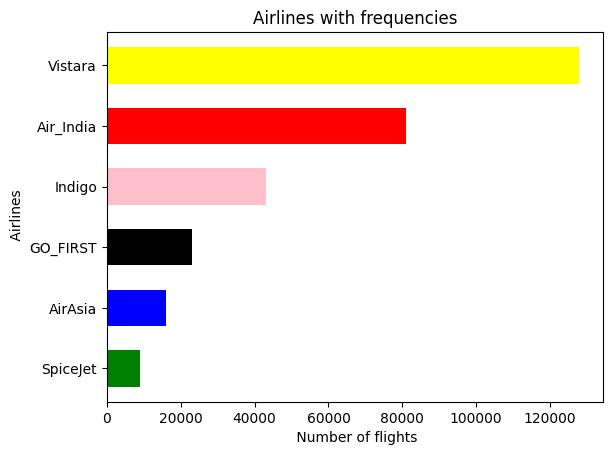

In [ ]:
# Showing all the Airlines with their Number of Flights in Horizontal Bar Graph

data['airline'].value_counts(ascending=True).plot.barh( color = ['green', 'blue','black','pink','red','yellow'],width=0.6)

plt.title("Airlines with frequencies")

plt.xlabel(" Number of flights")

plt.ylabel(" Airlines")

plt.show()

#  Bar Graphs representing the Departure Time & Arrival Time
  

In [ ]:
data.head()

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1,5953
1,SpiceJet,SG-8157,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1,5953
2,AirAsia,I5-764,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1,5956
3,Vistara,UK-995,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1,5955
4,Vistara,UK-963,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1,5955


In [ ]:
# Showing the Departure Time for the flights

departure_time=data['departure_time'].value_counts()
departure_time

,count
departure_time,
Morning,71146
Early_Morning,66790
Evening,65102
Night,48015
Afternoon,47794
Late_Night,1306


In [ ]:
# Showing the Arrival Time for the flights

arrival_time=data['arrival_time'].value_counts()
arrival_time

,count
arrival_time,
Night,4218
Evening,2829
Morning,2627
Afternoon,2260
Early_Morning,723
Late_Night,640
A,1


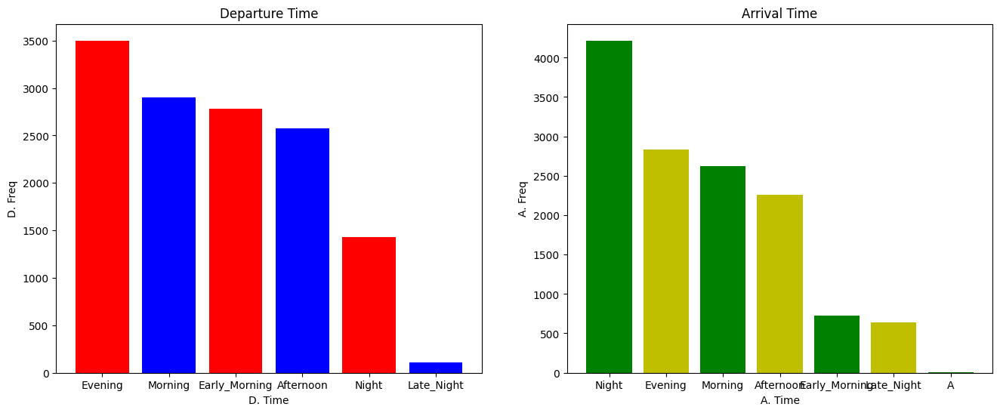

In [ ]:
# Showing the Departure Time & Arrival Time for the flights with their counts

plt.figure(figsize = (16,6))

plt.subplot(1,2,1)

plt.bar( departure_time.index ,departure_time.values, color = ['r', 'b'] )
plt.title("Departure Time")
plt.xlabel("D. Time")
plt.ylabel("D. Freq")

plt.subplot(1,2,2)

plt.bar(arrival_time.index, arrival_time.values, color = ['g', 'y'])
plt.title("Arrival Time")
plt.xlabel("A. Time")
plt.ylabel("A. Freq")

plt.show()

# Pie Chart representing the Source City & Destination City

In [ ]:
data.head()

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1.0,5953.0
1,SpiceJet,SG-8157,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1.0,5953.0
2,AirAsia,I5-764,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1.0,5956.0
3,Vistara,UK-995,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1.0,5955.0
4,Vistara,UK-963,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1.0,5955.0


In [6]:
# Showing the Source City of the flights

SC=data['source_city'].value_counts()
SC

,count
source_city,
Delhi,61343
Mumbai,60896
Bangalore,52061
Kolkata,46347
Hyderabad,40806
Chennai,38700


In [7]:
# Showing the Destination City of the flights

DC=data['destination_city'].value_counts()
DC

,count
destination_city,
Mumbai,59097
Delhi,57360
Bangalore,51068
Kolkata,49534
Hyderabad,42726
Chennai,40368


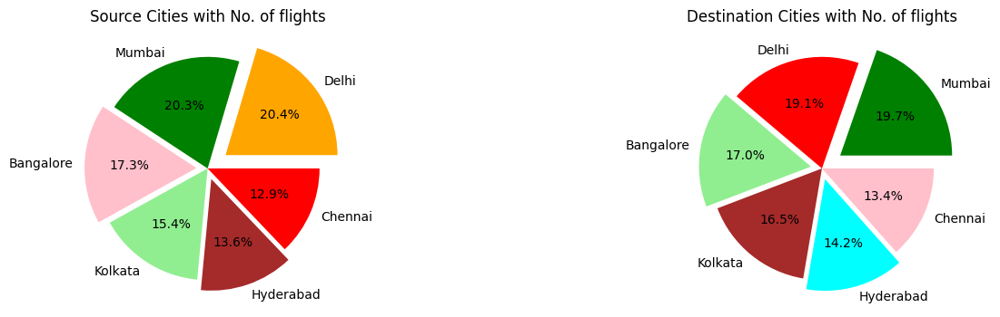

In [8]:
# Showing the Source City & Destination City for the flights with their counts

plt.figure( figsize= (16,4))

plt.subplot(1,2,1)

plt.pie( SC.values,labels=SC.index,colors=['orange','green','pink','lightgreen','brown','red'],autopct='%0.1f%%',explode=[0.2,0,0.1,0,0.1,0])
plt.title("Source Cities with No. of flights")
plt.subplot(1,2,2)

plt.pie(DC.values,labels=DC.index,colors = ['green', 'red','lightgreen','brown','cyan','pink'],explode=[0.2,0,0.1,0,0.1,0],autopct='%0.1f%%')
plt.title("Destination Cities with No. of flights")
plt.show()



# plot graph price varies with airlines

In [ ]:
data.head()

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1.0,5953.0
1,SpiceJet,SG-8157,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1.0,5953.0
2,AirAsia,I5-764,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1.0,5956.0
3,Vistara,UK-995,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1.0,5955.0
4,Vistara,UK-963,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1.0,5955.0


In [ ]:
# Grouping the airlines and checking their mean price

data.groupby('airline')['price'].mean()

,price
airline,
AirAsia,5998.578802
Air_India,7677.337216
GO_FIRST,6167.611940
Indigo,5873.559965
SpiceJet,5826.762570
Vistara,7634.127329


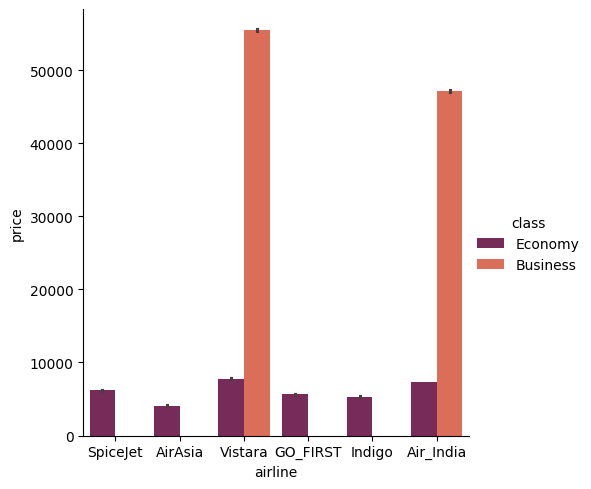

In [ ]:
# Drawing a Categorical Plot showing the Mean Ticket Price for each Airline

sns.catplot( data=data,x = 'airline', y = 'price', kind = 'bar',hue ='class',palette = 'rocket')

plt.show()

# ticket price change based on the departure time and arrival time

In [ ]:
data.head()

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1.0,5953.0
1,SpiceJet,SG-8157,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1.0,5953.0
2,AirAsia,I5-764,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1.0,5956.0
3,Vistara,UK-995,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1.0,5955.0
4,Vistara,UK-963,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1.0,5955.0


In [ ]:
# Checking the Mean Ticket Price based on the Departure Times

data.groupby('departure_time')['price'].mean()

,price
departure_time,
Afternoon,7212.570097
Early_Morning,6809.363016
Evening,6492.914310
Late_Night,3389.768519
Morning,7549.600345
Night,6283.117647


In [ ]:
# Checking the Mean Ticket Price based on the Arrival Times

data.groupby('arrival_time')['price'].mean()

,price
arrival_time,
A,NaN
Afternoon,7048.083186
Early_Morning,4902.146611
Evening,7537.363026
Late_Night,5402.182813
Morning,6375.951656
Night,7230.256757


/tmp/ipython-input-2551906190.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.catplot(x= 'departure_time', y = 'price', kind = 'bar', data = data, palette = 'rocket',legend=False)


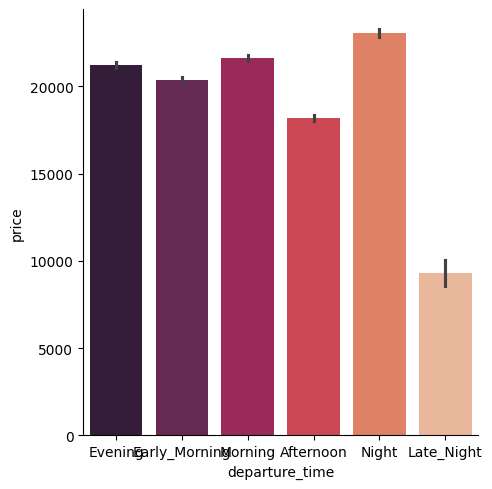

In [ ]:

sns.catplot(x= 'departure_time', y = 'price', kind = 'bar', data = data, palette = 'rocket',legend=False)

plt.show()


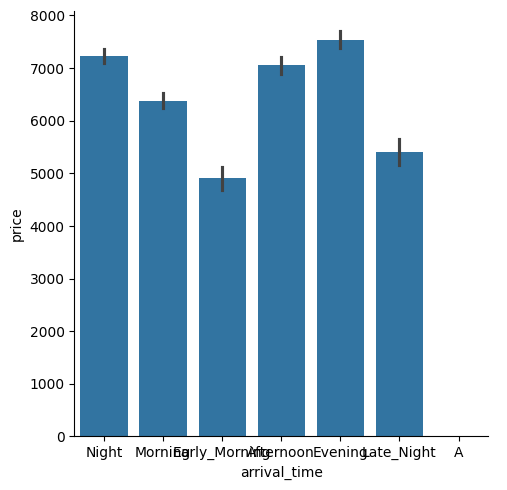

In [ ]:
sns.catplot( x = 'arrival_time', y = 'price', kind = 'bar', data = data )

plt.show()

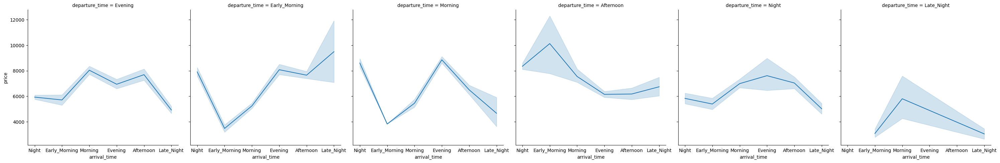

In [ ]:

sns.relplot( x = 'arrival_time', y = 'price', data = data, col = 'departure_time', kind = 'line')

plt.show()

# 'How the price changes with change in Source and Destination'

In [ ]:
data.head()

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1.0,5953.0
1,SpiceJet,SG-8157,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1.0,5953.0
2,AirAsia,I5-764,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1.0,5956.0
3,Vistara,UK-995,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1.0,5955.0
4,Vistara,UK-963,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1.0,5955.0


In [ ]:
# Checking the Mean Ticket Price for each Source City

data.groupby('source_city')['price'].mean()

,price
source_city,
Bangalore,21469.460575
Chennai,21995.339871
Delhi,18951.326639
Hyderabad,20155.623879
Kolkata,21746.235679
Mumbai,21483.818839


In [ ]:
# Checking the Mean Ticket Price for each Destination City

data.groupby('destination_city')['price'].mean()

,price
destination_city,
Bangalore,21593.955784
Chennai,21953.323969
Delhi,18436.767870
Hyderabad,20427.661284
Kolkata,21959.557556
Mumbai,21372.529469


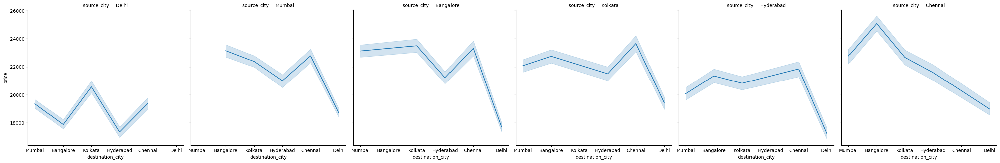

In [ ]:
sns.relplot( x = 'destination_city', y = 'price', data = data, col = "source_city", kind = 'line')

plt.show()

## How is the price affected when tickets are bought in just 1 or 2 days before departure

In [ ]:
data.head()

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1,5953
1,SpiceJet,SG-8157,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1,5953
2,AirAsia,I5-764,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1,5956
3,Vistara,UK-995,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1,5955
4,Vistara,UK-963,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1,5955


In [ ]:
data['days_left'].nunique()

49

In [ ]:
data['days_left'].unique()

array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13.,
       14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25., 26.,
       27., 28., 29., 30., 31., 32., 33., 34., 35., 36., 37., 38., 39.,
       40., 41., 42., 43., 44., 45., 46., 47., 48., 49., nan])

In [ ]:
# Checking the Mean Ticket Price for different days_left

data.groupby('days_left')['price'].mean()

,price
days_left,
1.0,13699.532751
2.0,12762.274809
3.0,13161.576923
4.0,10220.973684
5.0,9924.660920
6.0,10105.712707
7.0,10236.964187
8.0,10243.417553
9.0,11317.367647


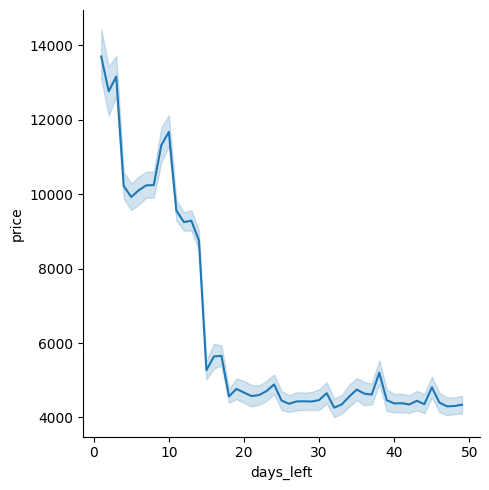

In [ ]:
sns.relplot( y='price', x = 'days_left', kind = 'line', data = data )

plt.show()

# Ticket price vary between Economy and Business class


In [ ]:
data.head()

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1.0,5953.0
1,SpiceJet,SG-8157,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1.0,5953.0
2,AirAsia,I5-764,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1.0,5956.0
3,Vistara,UK-995,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1.0,5955.0
4,Vistara,UK-963,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1.0,5955.0


In [ ]:
data['class'].unique()

array(['Economy', nan], dtype=object)

In [29]:
# Filtering out the records with Economy class

x = data [ data['class'] == 'Economy' ]
x

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1,5953
1,SpiceJet,SG-8157,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1,5953
2,AirAsia,I5-764,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1,5956
3,Vistara,UK-995,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1,5955
4,Vistara,UK-963,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1,5955
...,...,...,...,...,...,...,...,...,...,...,...
206661,Vistara,UK-832,Chennai,Early_Morning,one,Night,Hyderabad,Economy,13.83,49,7697
206662,Vistara,UK-832,Chennai,Early_Morning,one,Night,Hyderabad,Economy,13.83,49,7709
206663,Vistara,UK-826,Chennai,Afternoon,one,Morning,Hyderabad,Economy,20.58,49,8640
206664,Vistara,UK-822,Chennai,Morning,one,Morning,Hyderabad,Economy,23.33,49,8640


In [30]:
# Checking Mean Price for Economy class tickets

x.price.mean()

np.float64(6572.342383362527)

In [31]:
# Filtering out the records with Business class

y = data [ data['class'] == 'Business' ]

y

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
206666,Air_India,AI-868,Delhi,Evening,zero,Evening,Mumbai,Business,2.00,1,25612
206667,Air_India,AI-624,Delhi,Evening,zero,Night,Mumbai,Business,2.25,1,25612
206668,Air_India,AI-531,Delhi,Evening,one,Night,Mumbai,Business,24.75,1,42220
206669,Air_India,AI-839,Delhi,Night,one,Night,Mumbai,Business,26.50,1,44450
206670,Air_India,AI-544,Delhi,Evening,one,Night,Mumbai,Business,6.67,1,46690
...,...,...,...,...,...,...,...,...,...,...,...
300148,Vistara,UK-822,Chennai,Morning,one,Evening,Hyderabad,Business,10.08,49,69265
300149,Vistara,UK-826,Chennai,Afternoon,one,Night,Hyderabad,Business,10.42,49,77105
300150,Vistara,UK-832,Chennai,Early_Morning,one,Night,Hyderabad,Business,13.83,49,79099
300151,Vistara,UK-828,Chennai,Early_Morning,one,Evening,Hyderabad,Business,10.00,49,81585


In [32]:
# Checking Mean Price for Business class tickets

y.price.mean()

np.float64(52540.08112357868)

# The Average Price of Vistara airline for a flight from Delhi to Hyderabad in Business Class

In [33]:
data.head(1)

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1,5953


In [34]:
# applying filtering based on multiple conditions

new_data = data [(data['airline'] == 'Vistara') & (data['source_city'] == 'Delhi')
                 & (data['destination_city'] == 'Hyderabad') & (data['class'] == 'Business')]

new_data

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
219123,Vistara,UK-871,Delhi,Night,zero,Night,Hyderabad,Business,2.33,1,30630
219124,Vistara,UK-879,Delhi,Evening,zero,Evening,Hyderabad,Business,2.25,1,38470
219129,Vistara,UK-955,Delhi,Evening,one,Night,Hyderabad,Business,27.17,1,63513
219130,Vistara,UK-955,Delhi,Evening,one,Afternoon,Hyderabad,Business,18.50,1,65764
219131,Vistara,UK-985,Delhi,Evening,one,Night,Hyderabad,Business,25.08,1,69113
...,...,...,...,...,...,...,...,...,...,...,...
221863,Vistara,UK-963,Delhi,Morning,one,Early_Morning,Hyderabad,Business,23.00,49,53937
221864,Vistara,UK-985,Delhi,Evening,one,Early_Morning,Hyderabad,Business,12.00,49,59537
221865,Vistara,UK-985,Delhi,Evening,one,Afternoon,Hyderabad,Business,16.42,49,59537
221866,Vistara,UK-955,Delhi,Evening,one,Early_Morning,Hyderabad,Business,14.08,49,61889


In [36]:
# Checking the mean price

new_data['price'].mean()

np.float64(47939.840361445786)

#Plotting Pairwise Relationship (PairGrid Vs Pairplot)

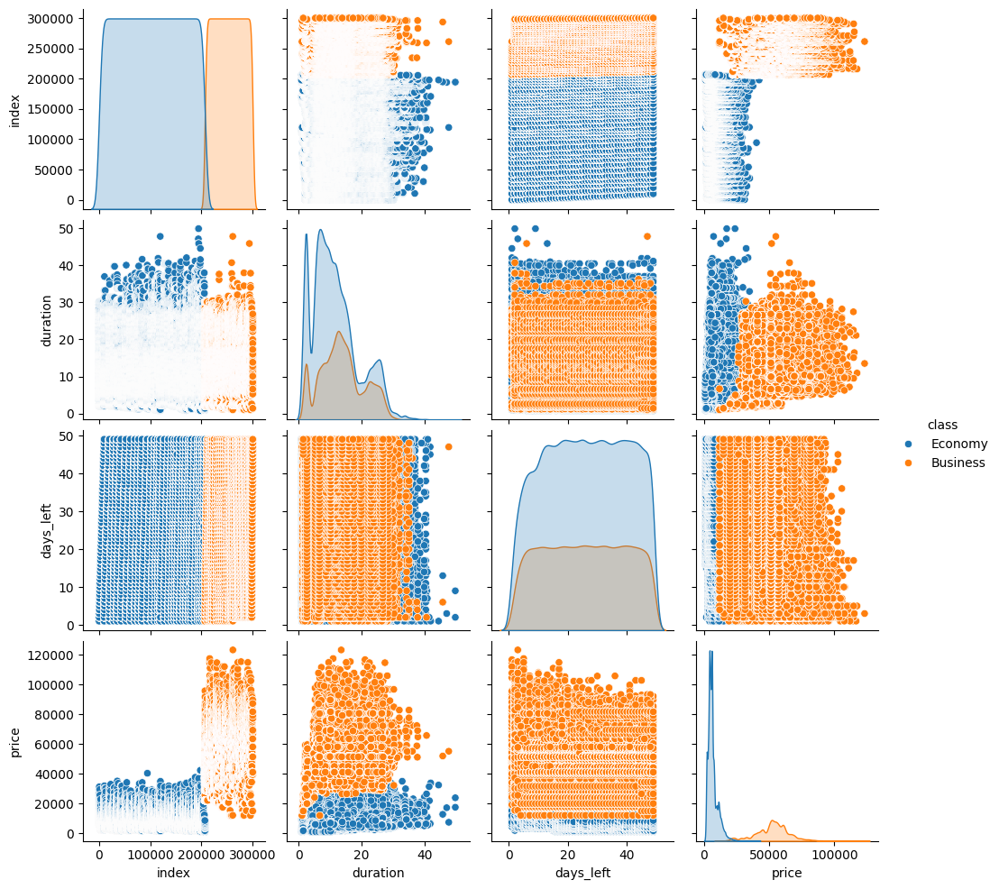

In [ ]:
sns.pairplot(data,hue='class')

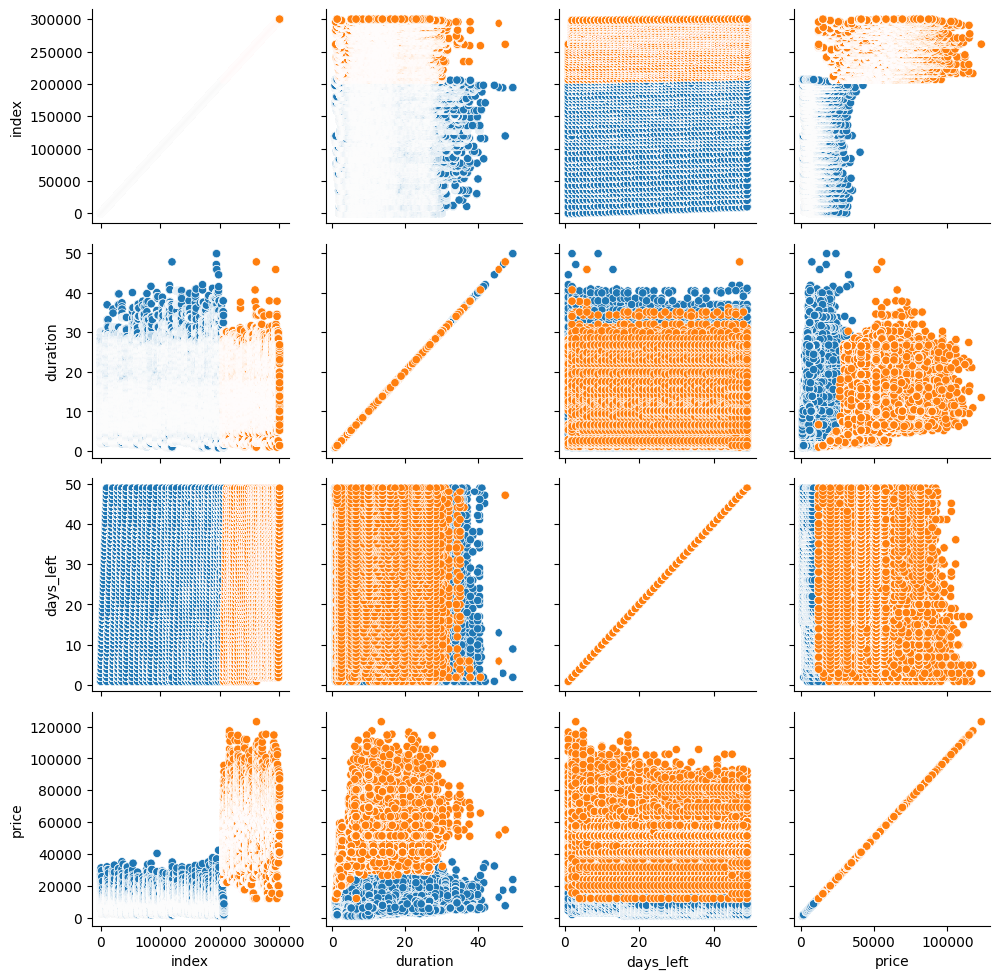

In [ ]:
# pair grid
g = sns.PairGrid(data=data,hue='class_sum')
# g.map
g.map(sns.scatterplot)

In [15]:
class_sum=data.groupby('class').sum()
class_sum

,index,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,duration,days_left,price
class,,,,,,,,,,,
Business,23690447183,Air_IndiaAir_IndiaAir_IndiaAir_IndiaAir_IndiaV...,AI-868AI-624AI-531AI-839AI-544UK-985AI-479AI-4...,DelhiDelhiDelhiDelhiDelhiDelhiDelhiDelhiDelhiD...,EveningEveningEveningNightEveningEveningNightE...,zerozerooneoneonezerooneoneonezerooneoneoneone...,EveningNightNightNightNightNightAfternoonEveni...,MumbaiMumbaiMumbaiMumbaiMumbaiMumbaiMumbaiMumb...,1281171.45,2406529,4911814564
Economy,21355314445,SpiceJetSpiceJetAirAsiaVistaraVistaraVistaraVi...,SG-8709SG-8157I5-764UK-995UK-963UK-945UK-927UK...,DelhiDelhiDelhiDelhiDelhiDelhiDelhiDelhiDelhiD...,EveningEarly_MorningEarly_MorningMorningMornin...,zerozerozerozerozerozerozerozerozerozerozeroze...,NightMorningEarly_MorningAfternoonMorningAfter...,MumbaiMumbaiMumbaiMumbaiMumbaiMumbaiMumbaiMumb...,2387004.61,5398875,1358279711


# plotting heatmap and catplot

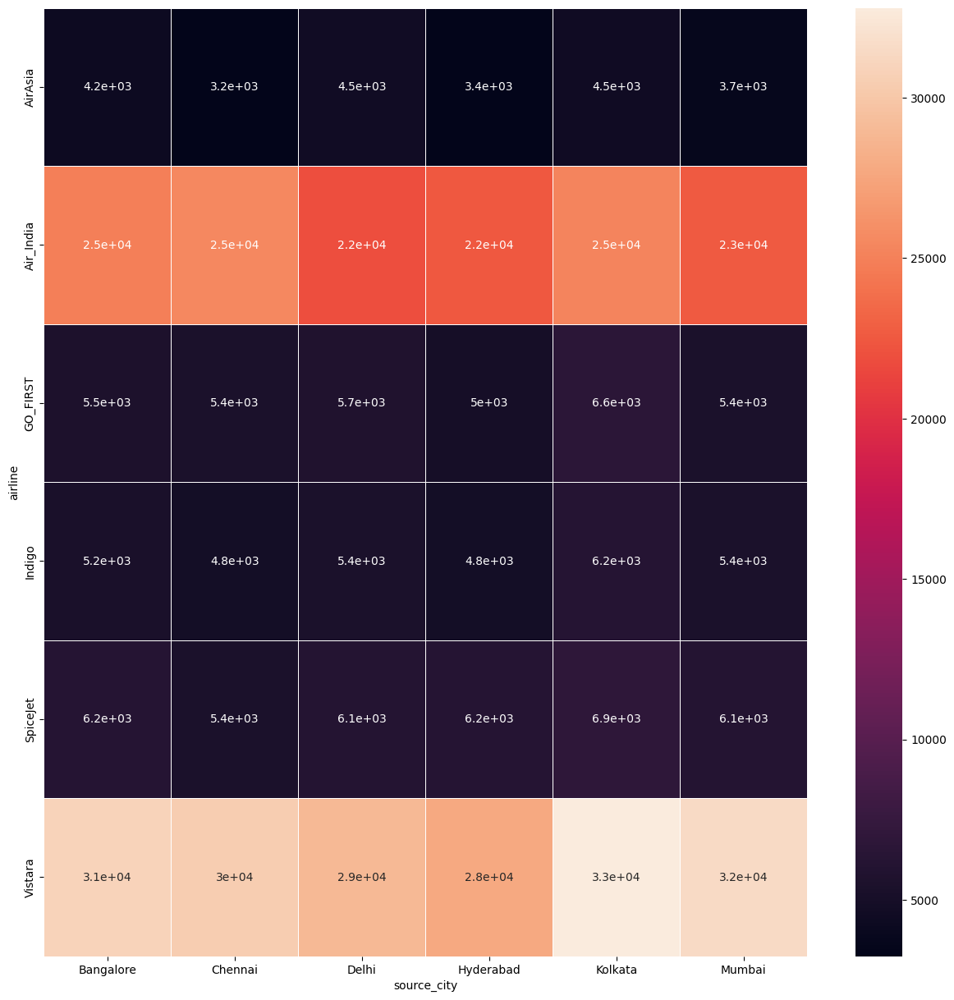

In [28]:
# Heatmap

# Calculate the mean price for each combination of 'airline' and 'source_city'
heatmap_data = data.groupby(['airline', 'source_city'])['price'].mean().reset_index()

# Plot rectangular data as a color-encoded matrix
heatmap_data = heatmap_data.pivot(index='airline', columns='source_city', values='price')

# axes level function
plt.figure(figsize=(15,15))
sns.heatmap(heatmap_data,linewidth=0.5,annot=True)
plt.show()

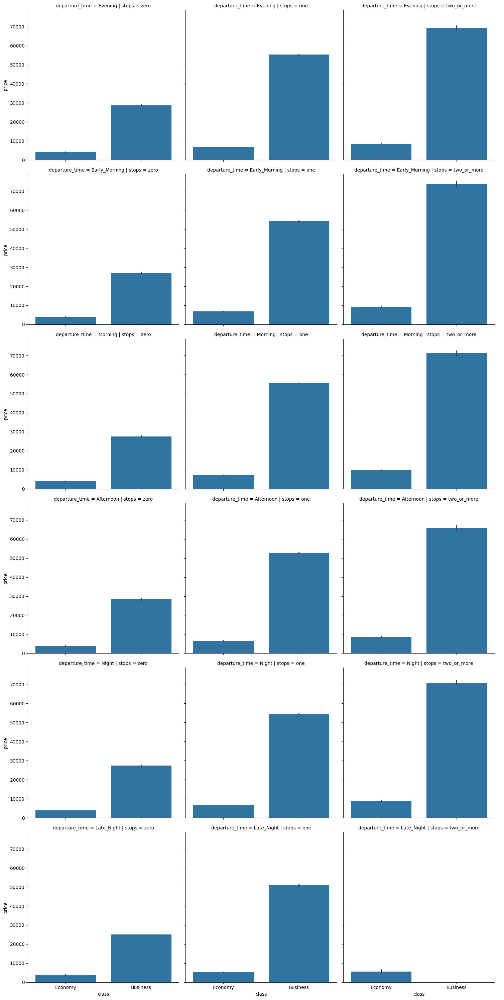

In [17]:
sns.catplot(data=data, x='class',y='price',col='stops',kind='bar',row='departure_time')